In [3]:

import pandas as pd
import numpy as np
from scipy.signal import savgol_filter
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector
import matplotlib.patches as patches
from collections import Counter
import cv2
import pickle
import glob

In [4]:
## identify videos
folder = r'C:\Users\custe\Emory\SOM Emanuel Lab - General\TMAZE\TMAZE_REFINED_VIDEOS'
listOfVideos = glob.glob(folder+'/*.mp4')



door_coords = {}


for video in listOfVideos[:10]:
    print('On video {}'.format(video))
    vid = cv2.VideoCapture(video) ##  video
    length = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))
    vid.set(cv2.CAP_PROP_POS_FRAMES, int(length/2)) ## set video to middle frame
    ret, frame = vid.read() ## read middle frame of video


    fg = frame[:60,:60] ## door size is about 60x60 pixels
    bg = frame ## middle frame of video
    bgCopy = bg.copy()
    move_rectangle = False
    BLUE = [255,0,0]
    RED = [0,0,255]

    initial_coords = {}
    initial_coords['door1'] = [220, 148]
    initial_coords['door2'] = [213, 448]
    initial_coords['door3'] = [929, 661]
    initial_coords['door4'] = [938, 46]

    final_coords = {}

    def mouse(event,x,y,flags,params):
        global move_rectangle, BLUE, fg, bg, bgCopy,final_coords, door
        #draw rectangle where x,y is rectangle center
        if event == cv2.EVENT_LBUTTONDOWN:
            move_rectangle = True

        elif event == cv2.EVENT_MOUSEMOVE:
            bg = bgCopy.copy() #!! your image is reinitialized with initial one
            if move_rectangle:
                cv2.rectangle(bg,(x-int(0.5*cols),y-int(0.5*rows)),
                (x+int(0.5*cols),y+int(0.5*rows)),BLUE, -1)

        elif event == cv2.EVENT_LBUTTONUP:
            move_rectangle = False
            cv2.rectangle(bg,(x-int(0.5*cols),y-int(0.5*rows)),
            (x+int(0.5*cols),y+int(0.5*rows)),BLUE, -1)
            final_coords[door] = [x,y]


    def draw_initial_coord(k):
        global bg, RED
        cv2.rectangle(bg,(initial_coords[k][0]-int(0.5*cols),initial_coords[k][1]-int(0.5*rows)),
        (initial_coords[k][0]+int(0.5*cols),initial_coords[k][1]+int(0.5*rows)),RED, -1)

    def set_final_coords(k,x,y):
        global final_coords
        final_coords[k] = [x,y]


    if __name__ == '__main__':
        rows, cols = fg.shape[:2]



        
        for door in initial_coords.keys():
            cv2.namedWindow('draw {}'.format(door))
            cv2.setMouseCallback('draw {}'.format(door), mouse)
            while True:
                cv2.imshow('draw {}'.format(door), bg)
                draw_initial_coord(door)
                k = cv2.waitKey(1)
                if k == 27 & 0xFF:
                    break
            cv2.destroyAllWindows()

    for door in initial_coords:
        try:
            print(door,final_coords[door])
        except KeyError:
            final_coords[door] = initial_coords[door] ## if the door was not moved, use the initial coordinates
            print(door,final_coords[door])
    door_coords[video] = final_coords

On video C:\Users\custe\Emory\SOM Emanuel Lab - General\TMAZE\TMAZE_REFINED_VIDEOS\BDC32024-01-23T15_25_35.mp4


In [9]:

for video in listOfVideos[:10]:
    print('On video {}'.format(video))
    vid = cv2.VideoCapture(video) ##  video
    length = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))
    ret, frame = vid.read() 
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    dc = door_coords[video]
    
    frameCounter = 0

    doorTraces = {}
    for door in range(4):
        doorkey = 'door{}'.format(door+1)
        doorTraces[doorkey] = []

    # Convert the first frame to grayscale
    gray1 = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    while True:
        # Read the next frame
        ret, frame2 = vid.read()
        if not ret:
            break

        # Convert the current frame to grayscale
        gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
        # Compute the absolute difference between the current frame and the previous frame
        diff = cv2.absdiff(gray1, gray2) 

        # Apply a threshold to get the binary image
        _, thresh = cv2.threshold(diff, 7, 255, cv2.THRESH_BINARY)
        
        
        doorImages = {}
        for door in range(4):
            doorkey = 'door{}'.format(door+1)
            doorImages[doorkey] = thresh[dc[doorkey][1]-30:dc[doorkey][1]+30, dc[doorkey][0]-30:dc[doorkey][0]+30]
        cv2.imshow('door1',doorImages['door1'])
        # Optional: Apply some morphological operations to reduce noise
        # kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        # thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

        # Highlight the motion areas in the original frame
        #motion_areas = cv2.bitwise_and(frame2, frame2, mask=thresh)

        # # Display the original frame and the thresholded difference
        # cv2.imshow('Original', frame2)
        # cv2.imshow('Motion Detection', motion_areas)
        
        
        
        for door in range(4):
            doorkey = 'door{}'.format(door+1)
            doorTraces[doorkey].append(np.sum(doorImages[doorkey]))
    

        # Update the previous frame
        gray1 = gray2
        frameCounter += 1
        
        if frameCounter % 200 == 0:
            print('On frame {} of {}'.format(frameCounter,length))
        # Break the loop on 'q' key press
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

    # Release the video capture object and close all OpenCV windows
    vid.release()
    cv2.destroyAllWindows()
    
    
    ### save doorTraces
    with open(video.split('.')[0]+'_doorTraces.pkl', 'wb') as f:
        pickle.dump(doorTraces, f, protocol=pickle.HIGHEST_PROTOCOL)


On video C:/Users/ajemanu/Emory University/SOM Emanuel Lab - General/TMAZE/TMAZE_REFINED_VIDEOS\BDC32024-01-23T15_25_35.mp4
On frame 200
On frame 400
On frame 600
On frame 800
On frame 1000
On frame 1200
On frame 1400
On frame 1600
On frame 1800
On frame 2000
On frame 2200
On frame 2400
On frame 2600
On frame 2800
On frame 3000
On frame 3200
On frame 3400
On frame 3600
On frame 3800
On frame 4000
On frame 4200
On frame 4400
On frame 4600
On frame 4800
On frame 5000
On frame 5200
On frame 5400
On frame 5600
On frame 5800
On frame 6000
On frame 6200
On frame 6400
On frame 6600
On frame 6800
On frame 7000
On frame 7200
On frame 7400
On frame 7600
On frame 7800
On frame 8000
On frame 8200
On frame 8400
On frame 8600
On frame 8800
On frame 9000
On frame 9200
On frame 9400
On frame 9600
On frame 9800
On frame 10000
On frame 10200
On frame 10400
On frame 10600
On frame 10800
On frame 11000
On frame 11200
On frame 11400
On frame 11600
On frame 11800
On frame 12000
On frame 12200
On frame 12400

In [7]:
cv2.destroyAllWindows()

In [7]:
import pickle
with open(r"C:\Users\ajemanu\Emory University\SOM Emanuel Lab - General\TMAZE\TMAZE_REFINED_VIDEOS\BDC32024-01-23T15_50_51_doorTraces.pkl", 'rb') as f:
    doorTraces = pickle.load(f)

[Text(0, 0, '0'),
 Text(100, 0, '100'),
 Text(200, 0, '200'),
 Text(300, 0, '300'),
 Text(400, 0, '400'),
 Text(500, 0, '500'),
 Text(600, 0, '600'),
 Text(700, 0, '700'),
 Text(800, 0, '800'),
 Text(900, 0, '900'),
 Text(1000, 0, '1000'),
 Text(1100, 0, '1100'),
 Text(1200, 0, '1200'),
 Text(1300, 0, '1300'),
 Text(1400, 0, '1400'),
 Text(1500, 0, '1500'),
 Text(1600, 0, '1600'),
 Text(1700, 0, '1700'),
 Text(1800, 0, '1800'),
 Text(1900, 0, '1900')]

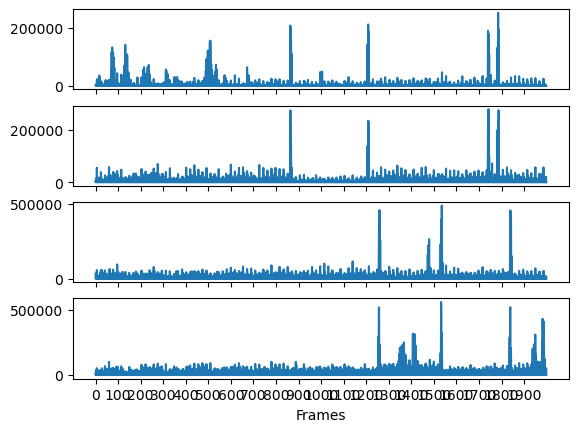

In [9]:
ind0, ind1 = 0, 2000

doorIDs = ['door1','door2','door3','door4']

f, ax = plt.subplots(4,1)
ax[0].plot(doorTraces[doorIDs[0]][ind0:ind1])
ax[1].plot(doorTraces[doorIDs[1]][ind0:ind1])
ax[2].plot(doorTraces[doorIDs[2]][ind0:ind1])
ax[3].plot(doorTraces[doorIDs[3]][ind0:ind1])

for a in range(3):
    ax[a].set_xticklabels([])
    ax[a].set_xticks(np.arange(ind0-ind0, ind1-ind0, 100))
ax[3].set_xlabel('Frames')
ax[3].set_xticks(np.arange(ind0-ind0, ind1-ind0, 100))
ax[3].set_xticklabels(np.arange(ind0, ind1, 100))


In [20]:
door1 = np.array(doorTraces[doorIDs[0]]) > 150000
door2 = np.array(doorTraces[doorIDs[1]]) > 150000
door3 = np.array(doorTraces[doorIDs[2]]) > 400000
door4 = np.array(doorTraces[doorIDs[3]]) > 400000

In [21]:
door1_filtered = np.zeros(len(door1),dtype=bool)
for n in range(len(door1)):
    try:
        if door1[n+1] or door1[n]:
            door1_filtered[n:n+2] = True
    except:
        pass
        
door2_filtered = np.zeros(len(door2),dtype=bool)
for n in range(len(door2)):
    try:
        if door2[n+1] or door2[n]:
            door2_filtered[n:n+2] = True
    except:
        pass

door3_filtered = np.zeros(len(door3),dtype=bool)
for n in range(len(door3)):
    try:
        if door3[n+1] or door3[n]:
            door3_filtered[n:n+2] = True
    except:
        pass

door4_filtered = np.zeros(len(door4),dtype=bool)
for n in range(len(door4)):
    try:
        if door4[n+1] or door4[n]:
            door4_filtered[n:n+2] = True
    except:
        pass

In [22]:
door1_filtered

array([False, False, False, ..., False, False, False])

In [23]:
bothDoorsChanging12 = np.bitwise_and(door1_filtered,door2_filtered)
bothDoorsChanging34 = np.bitwise_and(door3_filtered,door4_filtered)

In [24]:
doors12_change_frame = np.where(bothDoorsChanging12[1:] > bothDoorsChanging12[:-1])[0]
doors34_change_frame = np.where(bothDoorsChanging34[1:] > bothDoorsChanging34[:-1])[0]

In [25]:
doors34_change_frame.shape

(200,)

In [26]:
print(doors12_change_frame.shape,doors34_change_frame.shape)

(200,) (200,)


In [27]:
doors12_open_frame = doors12_change_frame[::2]
doors12_close_frame = doors12_change_frame[1::2]
doors34_open_frame = doors34_change_frame[::2]
doors34_close_frame = doors34_change_frame[1::2]

In [28]:
trial_starts = doors12_open_frame
trial_ends = doors34_open_frame

Text(0.5, 0, 'Trial Duration (s)')

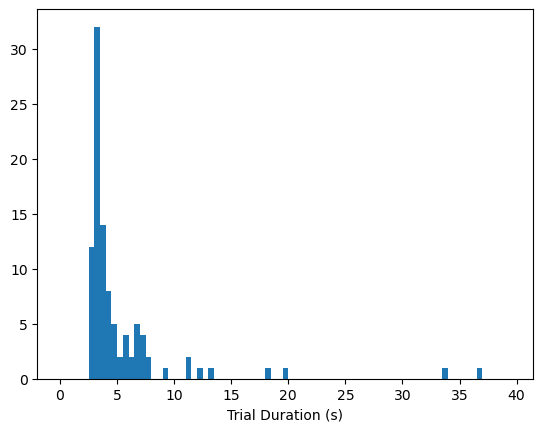

In [29]:
plt.hist(trial_ends/30 - trial_starts/30,np.arange(0,40,0.5))

plt.xlabel('Trial Duration (s)')

In [ ]:
## load dlc data associated with video 
dlc_dict = pd.read_hdf(r"C:\Users\custe\Emory\SOM Emanuel Lab - General\TMAZE\TMAZE_REFINED_VIDEOS\BDC32024-01-23T15_50_51DLC_resnet50_TMAZE DLC model May14shuffle1_300000_filtered.h5")

## create new dictionary for output
outDict = {}
outDict['originalFiles'] = []
n = 0
## load json files related to video
json_files = glob.glob(r'C:\Users\custe\Emory\SOM Emanuel Lab - General\TMAZE\TMAZE_DATA\data_BDC3_20240123*.json')
json_files.sort()
json_files = json_files[1:-1] # remove first and last json files for this particular video

for file in json_files:
    print('Working on file {}'.format(file))
    outDict['originalFiles']
    outDict['originalFiles'].append(file)
    json_dict = pd.read_json(file)
    for i in range(len(json_dict['BDC3'])):
        trialID = 'trial{}'.format(i+1)#Rfine the id
        outDict[n] = json_dict['BDC3'][trialID]
        outDict[n]['trajectory'] = dlc_dict[trial_starts[n]:trial_ends[n]] ## trial_starts and trial_ends are defined above and reflect frames in the refined video; would be ideal to reference X-Y pixel coordinates to maze landmarks
        n += 1

## save new dictionary to data folder
with open(r"C:\Users\custe\Emory\SOM Emanuel Lab - General\TMAZE\TMAZE_DATA\BDC32024-01-23T15_50_51.pkl", 'wb') as f:
    pickle.dump(outDict, f, protocol=pickle.HIGHEST_PROTOCOL)

Working on file C:/Users/ajemanu/Emory University/SOM Emanuel Lab - General/TMAZE/TMAZE_DATA\data_BDC3_20240123_155059.json
Working on file C:/Users/ajemanu/Emory University/SOM Emanuel Lab - General/TMAZE/TMAZE_DATA\data_BDC3_20240123_161037.json


In [89]:
outDict[0]

{'MazeTexture': 'R/S',
 'rewardBefLick': False,
 'lickUntilCorrect': False,
 'decision': 'incorrect',
 'floorID': 'F,3',
 'time_for_trial': 2,
 'valve': 3,
 'lick': 'right(V2)',
 'trial_number': 1,
 'trial_time': [2024, 1, 23, 15, 51, 4, 1, 23, 0],
 'right_probability': 0,
 'rewardAmount(ms)': 50,
 'trajectory': scorer    DLC_resnet50_TMAZE DLC model May14shuffle1_300000              \
 bodyparts                                          righteye               
 coords                                                    x           y   
 862                                              814.938721   61.425083   
 863                                              814.938721   61.425083   
 864                                              814.938721   61.425083   
 865                                              811.436584   52.347088   
 866                                              811.436584   52.347088   
 ...                                                     ...         ...   
 12

In [95]:
outDict[0]['trajectory'].droplevel(0,axis=1)

bodyparts     righteye                             lefteye              \
coords               x           y likelihood            x           y   
862         814.938721   61.425083   0.002432   804.159912   50.561745   
863         814.938721   61.425083   0.003027   804.159912   50.561745   
864         814.938721   61.425083   0.000396   796.122803   50.561745   
865         811.436584   52.347088   0.988290   796.122803   44.930912   
866         811.436584   52.347088   0.987980   796.122803   44.213127   
...                ...         ...        ...          ...         ...   
1250       1030.632812  556.478760   0.040301  1035.046631  555.363220   
1251       1030.632812  556.547546   0.053616  1035.046021  556.172668   
1252       1030.632812  556.547974   0.072448  1035.046631  556.175720   
1253       1030.160522  556.625183   0.072294  1034.797729  556.342896   
1254       1030.159790  557.464050   0.033268  1034.797485  556.773682   

bodyparts                tailbase                         
coords    likelihood            x           y likelihood  
862         0.000701   813.521790   59.250893   0.010902  
863         0.000908   813.532227   59.250893   0.011796  
864         0.000152   813.590149   59.250893   0.003010  
865         0.996954   813.521790   49.411411   0.021585  
866         0.996870   811.089294   49.411411   0.021926  
...              ...          ...         ...        ...  
1250        0.999605  1041.786499  460.707642   0.999867  
1251        0.999482  1042.522949  462.538055   0.999836  
1252        0.999283  1042.794312  463.309296   0.999843  
1253        0.999281  1042.794312  463.309875   0.999843  
1254        0.999864  1042.794312  463.596924   0.999708  

[393 rows x 9 columns]

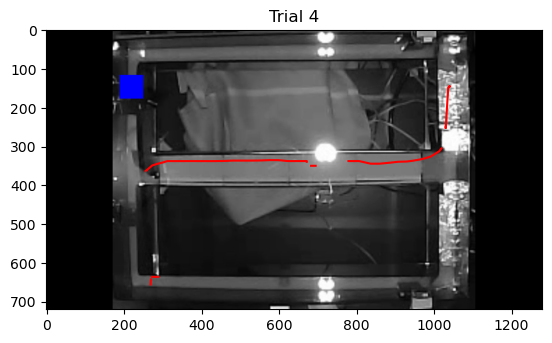

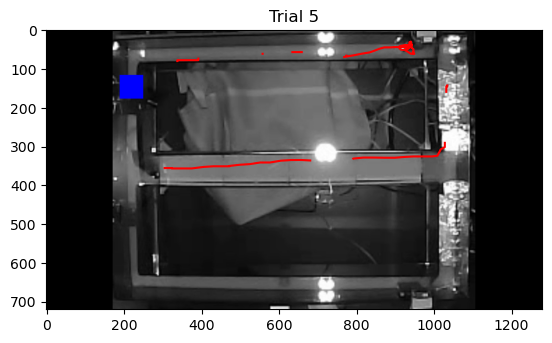

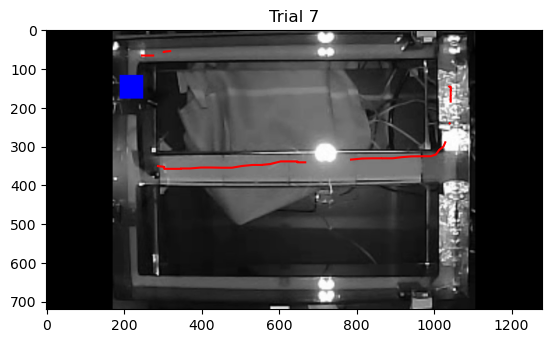

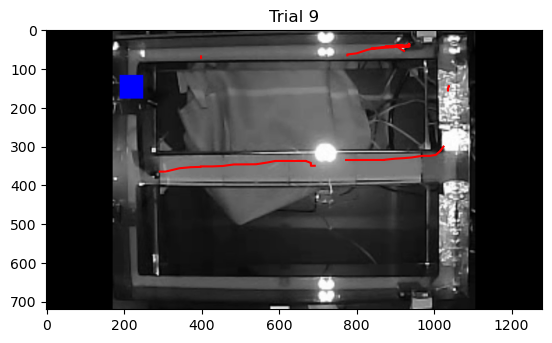

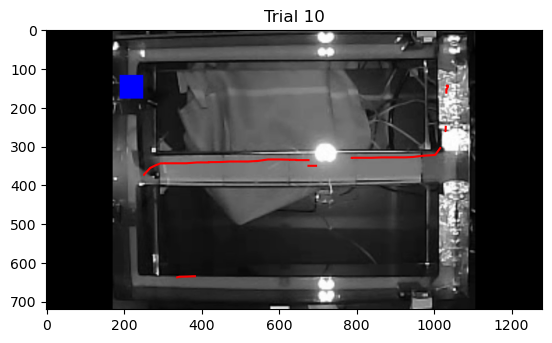

...

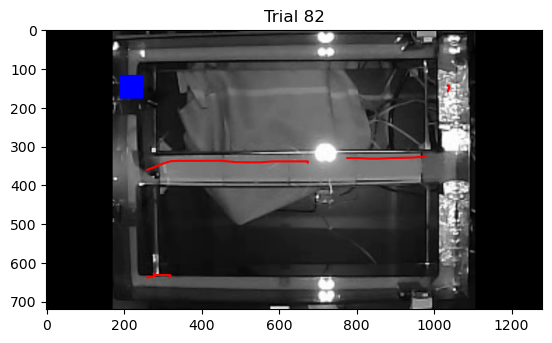

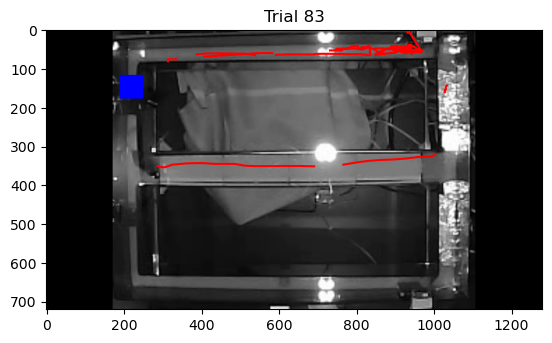

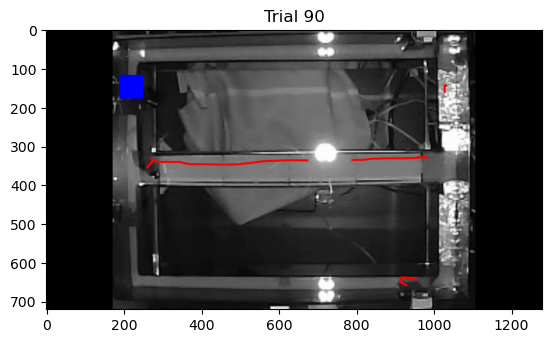

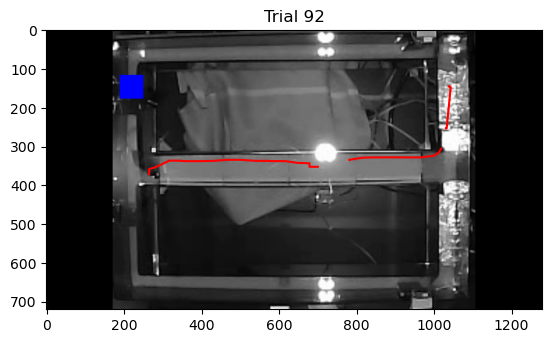

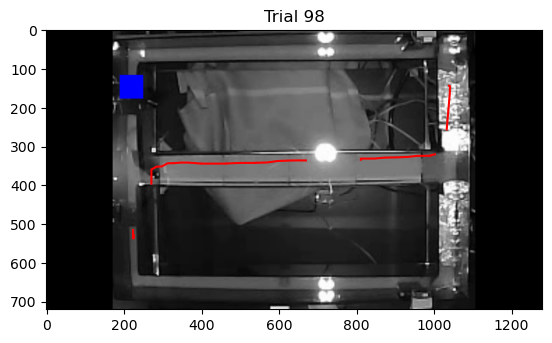

In [102]:
## plotting the trajectories for left trials
for k in outDict:
    if type(k) == int:
        if outDict[k]['lick'] == 'left(V1)':
            plt.figure()
            plt.imshow(frame,cmap='gray')
            filt_x = np.copy(outDict[k]['trajectory'].droplevel(0,axis=1)['lefteye']['x'])
            filt_x[outDict[k]['trajectory'].droplevel(0,axis=1)['lefteye']['likelihood'] < 0.1] = np.nan
            filt_y = np.copy(outDict[k]['trajectory'].droplevel(0,axis=1)['lefteye']['y'])
            filt_y[outDict[k]['trajectory'].droplevel(0,axis=1)['lefteye']['likelihood'] < 0.1] = np.nan
            plt.plot(filt_x,filt_y,color='r')
            plt.title('Trial {}'.format(k))
            plt.show()
            plt.close()

In [77]:
json_dict['BDC3']['trial1']

{'MazeTexture': 'R/S',
 'rewardBefLick': False,
 'lickUntilCorrect': False,
 'decision': 'correct',
 'floorID': 'F,2',
 'time_for_trial': 2,
 'valve': 2,
 'lick': 'right(V2)',
 'trial_number': 1,
 'trial_time': [2024, 1, 23, 15, 26, 51, 1, 23, 0],
 'right_probability': 1,
 'rewardAmount(ms)': 50}

In [63]:
dlc_dict[start:end]

scorer    DLC_resnet50_TMAZE DLC model May14shuffle1_300000              \
bodyparts                                          righteye               
coords                                                    x           y   
73858                                            257.466553  638.127869   
73859                                            257.466919  638.955994   
73860                                            257.466919  638.958862   
73861                                            261.789825  660.762268   
73862                                            261.791077  660.762268   
...                                                     ...         ...   
73945                                           1027.331055  558.903687   
73946                                           1027.330811  558.905396   
73947                                           1026.018066  559.418030   
73948                                           1026.018066  561.042236   
73949                    

In [61]:
for trial in range(len(trial_starts)):
    start = trial_starts[trial]
    end = trial_ends[trial]
    print(dlc_dict[start:end])

scorer    DLC_resnet50_TMAZE DLC model May14shuffle1_300000              \
bodyparts                                          righteye               
coords                                                    x           y   
862                                              814.938721   61.425083   
863                                              814.938721   61.425083   
864                                              814.938721   61.425083   
865                                              811.436584   52.347088   
866                                              811.436584   52.347088   
...                                                     ...         ...   
1250                                            1030.632812  556.478760   
1251                                            1030.632812  556.547546   
1252                                            1030.632812  556.547974   
1253                                            1030.160522  556.625183   
1254                     

In [59]:
dlc_dict[trial_starts[0]:trial_ends[0]]

scorer    DLC_resnet50_TMAZE DLC model May14shuffle1_300000              \
bodyparts                                          righteye               
coords                                                    x           y   
862                                              814.938721   61.425083   
863                                              814.938721   61.425083   
864                                              814.938721   61.425083   
865                                              811.436584   52.347088   
866                                              811.436584   52.347088   
...                                                     ...         ...   
1250                                            1030.632812  556.478760   
1251                                            1030.632812  556.547546   
1252                                            1030.632812  556.547974   
1253                                            1030.160522  556.625183   
1254                                            1030.159790  557.464050   

scorer                                                                 \
bodyparts                 lefteye                            tailbase   
coords    likelihood            x           y likelihood            x   
862         0.002432   804.159912   50.561745   0.000701   813.521790   
863         0.003027   804.159912   50.561745   0.000908   813.532227   
864         0.000396   796.122803   50.561745   0.000152   813.590149   
865         0.988290   796.122803   44.930912   0.996954   813.521790   
866         0.987980   796.122803   44.213127   0.996870   811.089294   
...              ...          ...         ...        ...          ...   
1250        0.040301  1035.046631  555.363220   0.999605  1041.786499   
1251        0.053616  1035.046021  556.172668   0.999482  1042.522949   
1252        0.072448  1035.046631  556.175720   0.999283  1042.794312   
1253        0.072294  1034.797729  556.342896   0.999281  1042.794312   
1254        0.033268  1034.797485  556.773682   0.999864  1042.794312   

scorer                            
bodyparts                         
coords              y likelihood  
862         59.250893   0.010902  
863         59.250893   0.011796  
864         59.250893   0.003010  
865         49.411411   0.021585  
866         49.411411   0.021926  
...               ...        ...  
1250       460.707642   0.999867  
1251       462.538055   0.999836  
1252       463.309296   0.999843  
1253       463.309875   0.999843  
1254       463.596924   0.999708  

[393 rows x 9 columns]

In [35]:
righteye = dlc_dict['DLC_resnet50_TMAZE DLC model May14shuffle1_300000']['righteye']
lefteye = dlc_dict['DLC_resnet50_TMAZE DLC model May14shuffle1_300000']['lefteye']
tailbase = dlc_dict['DLC_resnet50_TMAZE DLC model May14shuffle1_300000']['tailbase']

righteye_filtered = np.copy(righteye)
righteye_filtered[righteye['likelihood'] < 0.5] = np.nan

lefteye_filtered = np.copy(lefteye)
lefteye_filtered[lefteye['likelihood'] < 0.5] = np.nan

tailbase_filtered = np.copy(tailbase)
tailbase_filtered[tailbase['likelihood'] < 0.5] = np.nan

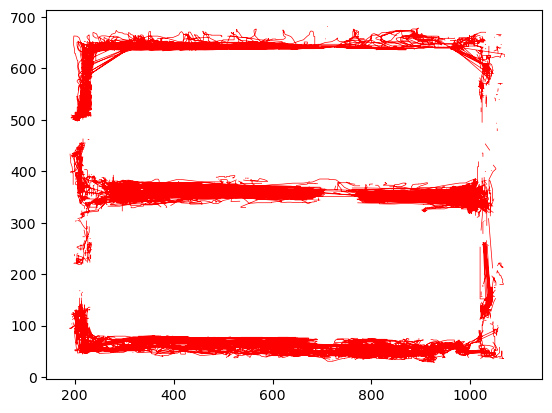

In [36]:
plt.plot(righteye_filtered[:,0],righteye_filtered[:,1],lw=0.5,color='r')

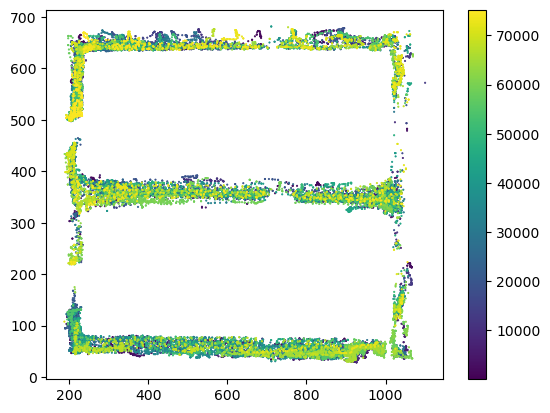

In [37]:
plt.scatter(righteye_filtered[:,0],righteye_filtered[:,1],s=1,c=np.arange(len(righteye_filtered)),cmap='viridis',linewidth=0.5)
plt.colorbar()

In [39]:
righteye_filtered[trial_starts[trial]:trial_ends[trial],0],righteye_filtered[trial_starts[trial]:trial_ends[trial],1]

(array([ 257.46655273,  257.46691895,  257.46691895,           nan,
                  nan,           nan,           nan,           nan,
                  nan,           nan,           nan,           nan,
                  nan,           nan,           nan,           nan,
                  nan,           nan,           nan,           nan,
                  nan,  261.68261719,  261.68261719,  286.61810303,
         304.71557617,  304.72061157,  324.56399536,  347.36654663,
         347.37185669,  371.90686035,  398.57470703,  398.57528687,
         428.97259521,  464.77578735,  464.77700806,  498.58782959,
         533.6517334 ,  533.65301514,  563.46270752,  595.02502441,
         595.02783203,  626.53912354,  649.23675537,  649.23712158,
         671.85241699,  691.81799316,  691.82714844,           nan,
         767.37677002,  767.37817383,  797.74694824,  829.58996582,
         829.59136963,  859.69500732,  886.46569824,  886.46594238,
         914.53668213,  938.62316895,  938.62945

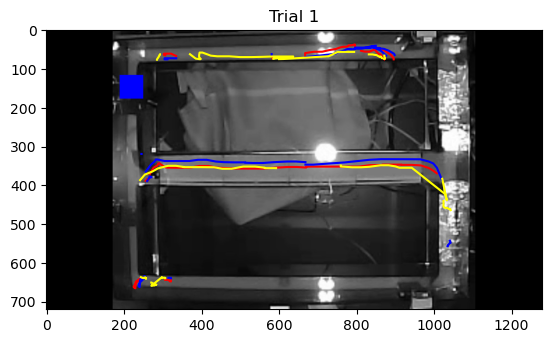

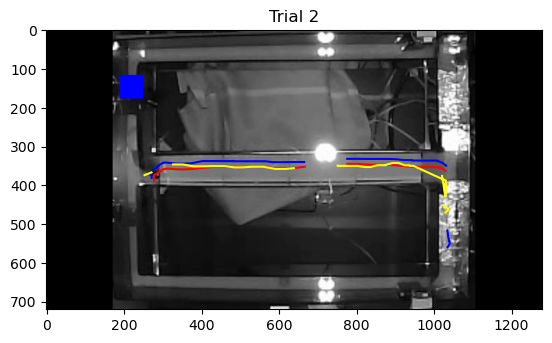

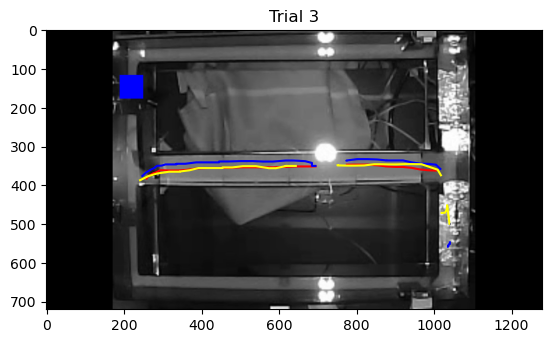

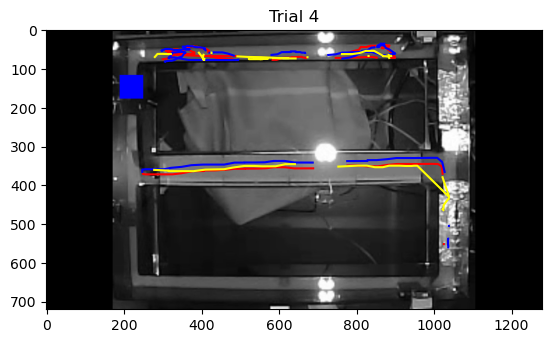

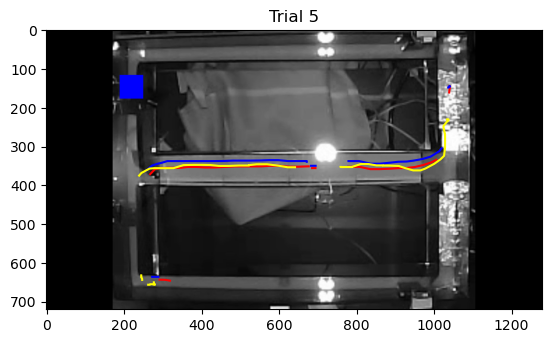

...

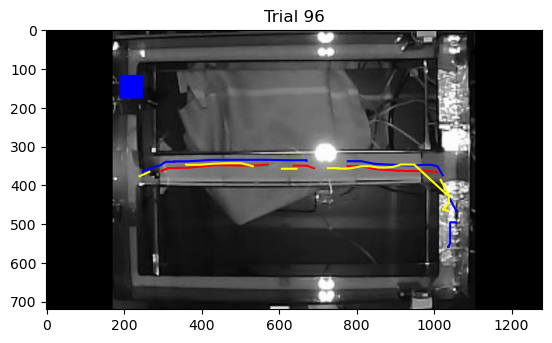

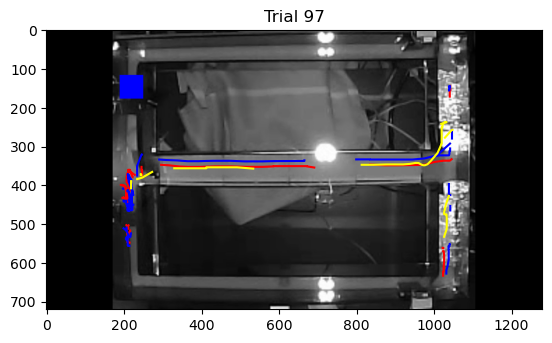

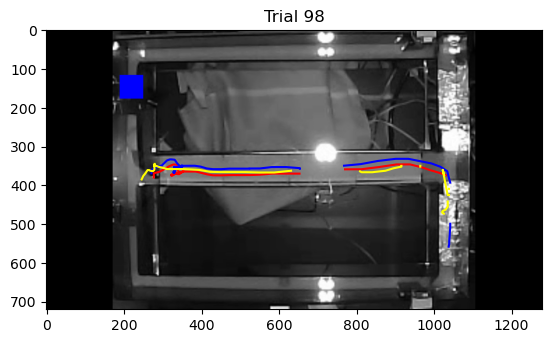

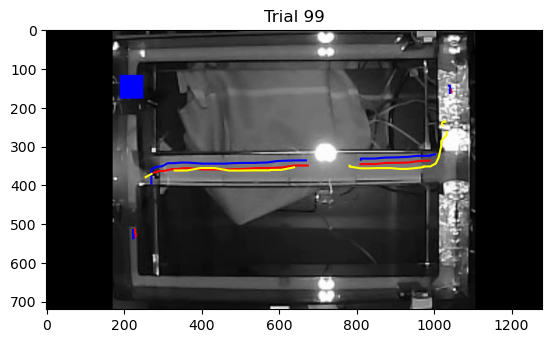

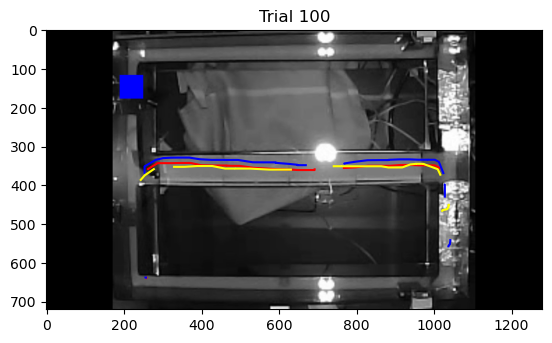

In [38]:
for trial in range(len(trial_starts)):
    plt.figure()
    plt.imshow(frame,cmap='gray')
    plt.plot(righteye_filtered[trial_starts[trial]:trial_ends[trial],0],righteye_filtered[trial_starts[trial]:trial_ends[trial],1],color='r')
    plt.plot(lefteye_filtered[trial_starts[trial]:trial_ends[trial],0],lefteye_filtered[trial_starts[trial]:trial_ends[trial],1],color='b')
    plt.plot(tailbase_filtered[trial_starts[trial]:trial_ends[trial],0],tailbase_filtered[trial_starts[trial]:trial_ends[trial],1],color='yellow')
    plt.title('Trial {}'.format(trial+1))
    plt.show()
    plt.close()


In [34]:
trial_starts[84]/30/60, trial_ends[84]/30/60

(32.00888888888889, 34.86833333333333)